# CS-503 Graded Notebook on Robustness

#### Goals:

The goal of this notebook is to familiarize yourself with the following topics:
- Model performance against In-distribution (ID) & Out-of-distribution (OOD) test examples
- Distribution shifts (adversarial, non-adversarial) such as 2D and 3D Common Corruptions, i-FGSM attacks.
- Evaluating model robustness
- Improving model robustness
- Test-time adaptation

This notebook aims to give you an understanding of the robustness issues that neural networks are facing and some of the most recent methods to alleviate them. 

There will be open-ended questions in each section.  

If you want to know more about these topics, please see the reading material in the lecture notes and feel free to ask the TAs.


#### Instructions:

- Your task is to fill in the missing code (denoted by ???) and perform some evaluations.
- We also ask several open questions. Please be concise. Some of them may have multiple explanations and they are meant to serve as brainstorming points. Try to explain your ideas clearly and refer to the relevant course material or papers as you see fit.
- Submit the notebook with all cells executed.
- We should be able to "Restart Kernel and Run All Cells" and get similar outputs to your solution.
- The notebooks are individual homework. 

#### **Submission and due date**: → see Moodle

---

## 1 Setup

We highly recommend running the notebook on a GPU, e.g. by opening it on [Colab](https://colab.research.google.com/).
That said, if you have the patience, you can also run it on regular CPUs or on Apple Silicon (neither is recommended).

### 1.1 Dependencies

We assume you know how to set up Python virtual environments, install packages and use Colab. If not, please come to the exercise session for troubleshooting.

This notebook requires:
- PyTorch & torchvision
- dataclasses
- timm
- matplotlib
- tqdm
- sklearn

In [1]:
# Dependencies. If you already have them installed, no need to run this cell.
!pip install torch torchvision matplotlib tqdm timm==0.5.4 dataclasses sklearn scikit-learn scikit-image==0.19.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 431.5/431.5 kB 10.2 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [2]:
## Download the data and models

! wget 'https://drive.switch.ch/index.php/s/1VPvFkKN8Vu7w31/download'
! unzip download

--2023-04-10 20:13:32--  https://drive.switch.ch/index.php/s/1VPvFkKN8Vu7w31/download
Resolving drive.switch.ch (drive.switch.ch)... 86.119.34.137, 86.119.34.138, 2001:620:5ca1:1ee::11, ...
Connecting to drive.switch.ch (drive.switch.ch)|86.119.34.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 714071291 (681M) [application/zip]
Saving to: ‘download’

download            100%[===================>] 680.99M  44.1MB/s    in 14s     

2023-04-10 20:13:46 (47.5 MB/s) - ‘download’ saved [714071291/714071291]

Archive:  download
   creating: data/
   creating: data/depth/
  inflating: data/depth/point_0_view_0_domain_depth_euclidean.png  
   creating: data/rgb/
  inflating: data/rgb/point_0_view_0_domain_rgb.png  
  inflating: data/rgb/point_2_view_9_domain_rgb.png  
  inflating: data/rgb/point_0_view_0_domain_fog.png  
   creating: data/rgb_test/
  inflating: data/rgb_test/demo_0.png  
  inflating: data/rgb_test/demo_1.png  
  inflating: data/rgb_test/demo_2.png

In [4]:
!pip install timm==0.5.4 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached timm-0.5.4-py3-none-any.whl (431 kB)


In [5]:
from tqdm.auto import tqdm
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision
import matplotlib.pyplot as plt


from torchvision import transforms

from models.unet import UNet
from models import DPTRegressionModel
from models.models import TrainableModel, WrapperModel, DataParallelModel
from models.utils import *
import argparse
import copy


import PIL
from PIL import Image

%matplotlib inline
%load_ext autoreload
%autoreload 2

if torch.cuda.is_available():
    device = torch.device('cuda')
    !nvidia-smi
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device('mps')
else:
    device = torch.device('cpu')
    
print('Selected device:', device)

Mon Apr 10 20:14:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P8    12W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [6]:
device

device(type='cuda')

### 1.2 Data and Model

To reduce the computational cost of running this notebook, we'll use a small set of test images and a standard UNet model trained on the [Taskonomy](http://taskonomy.stanford.edu/) dataset. The model predicts surface normals (3D orientation of each pixel in the given image) which is a dense prediction task, unlike low-dimensional tasks such as image classification. This should be useful especially when visually investigating the results. Please note that most of the findings we will explore are not task specific.

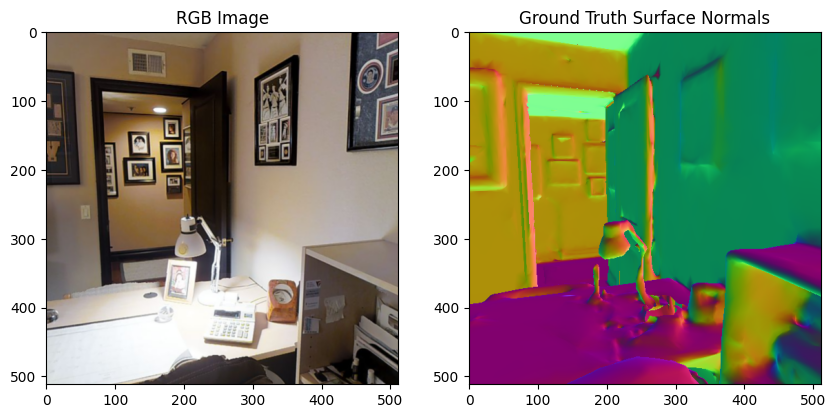

In [7]:
## Image transforms
trans_totensor = transforms.Compose([transforms.Resize(256, interpolation=PIL.Image.NEAREST),
                                    transforms.CenterCrop(256),
                                    transforms.ToTensor()])
trans_topil = transforms.ToPILImage()

## Load model
model_arch = UNet(out_channels=3)
map_location = (lambda storage, loc: storage.cuda()) if torch.cuda.is_available() else torch.device('cpu')
model = WrapperModel(DataParallelModel(model_arch.to(device)))
model_state_dict = torch.load('./models/ckpts/rgb2normal_tasko_unet.pth', map_location=map_location)
model.load_state_dict(model_state_dict["('rgb', '"+'normal'+"')"])

## Load image 
img_path = './data/rgb/point_0_view_0_domain_rgb.png'
img = Image.open(img_path)
img_tensor = trans_totensor(img)[:3].unsqueeze(0).to(device)

## Load ground truth normals
gt_path = './data/normals_gt/point_0_view_0_domain_normal.png'
gt = Image.open(gt_path)
gt_tensor = trans_totensor(gt)[:3].unsqueeze(0)

## Let's visualize the RGB image and its ground truth (GT) surface normals.

plt.subplots(1,2, figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(img)
plt.title('RGB Image')

plt.subplot(1,2,2)
plt.imshow(gt)
plt.title('Ground Truth Surface Normals');

## Observe that in the GT each color corresponds to a particular orientation, e.g. purple denotes the surfaces pointing upwards, dark green points leftward, etc. 
# Then the goal of the trained model is to predict these color values as close as possible to the GT when given an RGB image.

#### 1.3 In-distribution evaluation (10 pts)
The above sample we loaded is from Taskonomy test data while the model is trained on Taskonomy training data. We can assume that the test and train images are coming from the same distribution, i.e. the test sample is "in-distribution" (ID). This is a standard assumption in most of the ML settings. Thus, we expect the models we trained on some training data to generalize to test samples coming from the same distribution. Hence, ID generalization ability is a must for having a reasonable ML model in the first place.

Now, let's pass the input image to the UNet model to obtain the model predictions. Then create a 1x4 figure and plot the following visuals side-by-side:
1. Input Image
2. Ground Truth (GT)
3. Model Predictions
4. Error image (see below)

For the error image, you can visualize the absolute difference between GT and model predictions, i.e. l1 error. Please also put the mean l1 error in the title. 

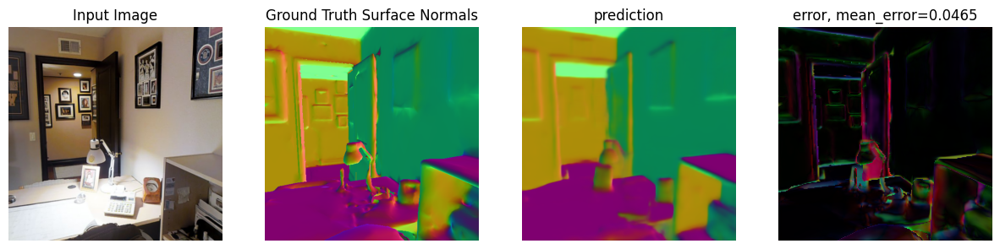

In [8]:
## Obtain the prediction for UNet model given the RGB image
prediction = model(img_tensor)
prediction = prediction[0].permute(1, 2, 0).detach().cpu()
## Visualize the input image, ground truth, prediction, and error image
fig, axes = plt.subplots(1,4, figsize=(15,15))


axes[0].imshow(img)
axes[0].set_title('Input Image')

axes[1].imshow(gt)
axes[1].set_title('Ground Truth Surface Normals');

axes[2].imshow(prediction)
axes[2].set_title('prediction')

error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
axes[3].imshow(error_img)
mean_error = torch.mean(error_img)
axes[3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

[ax.set_axis_off() for ax in axes];

#### 1.4 Open ended question on in-distribution (ID) prediction (5 pts)

#### Question:
Observe the errors made by the model for this test image. 
1. What is the mean l1 error made by the model on this image?
2. When you examine visually, where are the errors accumulated? What could be the reason for that?
3. Would you consider this as a reasonable prediction? Explain why.

#### Answer:

1. The mean l1 error on this image is 0.0465
2. The errors are accumulated in the edges of the objects. The reason is that the surface normals have sharp transitions in the edges.  
3. Yes, the prediction and the ground through normals are similar, thus it sounds reasonable.

## 2. Creating distribution shifts

In many practical cases training and test sets may not come from the same distribution. In other words, there is a "distribution shift" going from training to testing phase. This results in reduced model performance, which is undesirable.

Now let's start creating some distribution shifts on this test image. Basically, we'll modify it in ways that will make it deviate from the original data distribution. There are many ways to do it. We'll explore the ones based on 2D and 3D image corruptions, and adversarial attacks.

### 2.1. 2D Image Corruptions
These are corruptions applied on RGB images without any previous knowledge required on the image. There are quite many of them, so we'll explore only a few. See [Hendrycks et al. (2019)](https://arxiv.org/abs/1903.12261) for more.

![Common Corruptions](https://raw.githubusercontent.com/hendrycks/robustness/master/assets/imagenet-c.png)

#### Corruption #1: Gaussian Noise (10 pts)

This is one of the most commonly used noise types for modeling different environmental conditions, e.g. low-lighting. To corrupt the test image with Guassian noise, you simply perform

$$  X_{gaussian~noise} = X_{clean} + \text{Noise} $$

where each entry of Noise is sampled i.i.d from a Gaussian distribution with zero mean and some standard deviation (std).


Now, in the cell below, please do the followings:

1. Define a gaussian_noise function that takes an input image and std. It should return the image corrupted with the Gaussian Noise parameterized by zero mean and given std. See the above bird image with Gaussian Noise for an example.

2. Pass the image corrupted with Gaussian Noise to the model and get the prediction. Do this for three different std values, for example 0.08, 0.26, 0.44.

3. For each std level, obtain the above 1x4 visualizations we had before (Input image, GT, predictions, error image with mean l1 error in the title). So in total you should have a 3x4 plot. Please don't forget to put mean l1 errors in the title of the error image.


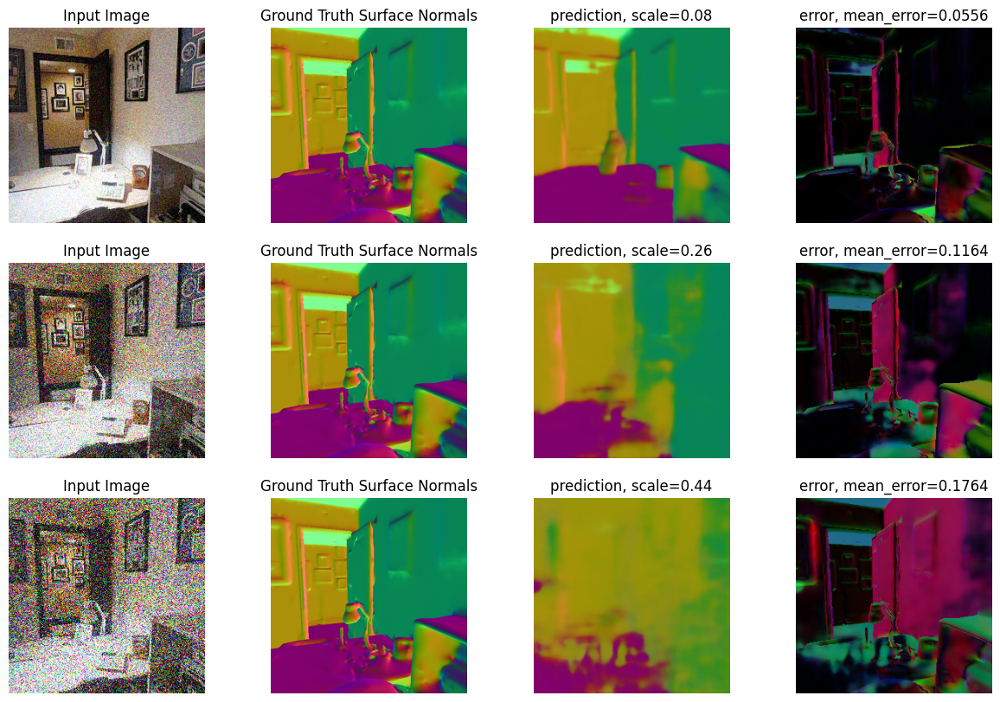

In [9]:
## Create Gaussian Noise

def gaussian_noise(x, scale=0):
    return x + torch.randn_like(x) * scale

## Apply the corruption at 3 different scale levels to create an increasing amount of distribution shift. Observe the errors

fig, axes = plt.subplots(3, 4, figsize=(15, 10))

for i, scale in enumerate([.08, .26, .44]):
    x = gaussian_noise(img_tensor, scale=scale)
    ## Obtain the prediction for UNet model given the RGB image
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()
    ## Visualize the input image, ground truth, prediction, and error image

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title(f'prediction, scale={scale}')

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];

#### Open ended questions on creating distribution shift with Gaussian Noise (5 pts)

#### Question:
Observe the errors made by the model for the above three results. 
1. Do you see an increase in the error compared to the ID predictions made by the model? 
2. What happens when you increase the standard deviation of the sampled Gaussian Noise? Explain why.

#### Answer:

1. Yes, the error has clearly increased.
2. As the std of the sampled Gaussian noise increases, the amount of noises increases and this leads to an increase in the l1 error. This is because when we increase the std of the Gaussian noise, the noise has more deviation from the mean 0; therefore, there is an increase in the pixel-wise shift, which results in less accurate predictions and more l1 error. 

#### Corruption #2: Gaussian Blur (5 pts)

This time we will apply a low-pass filter to the image to blur it. This corresponds to convolving the image with a Gaussian kernel. You can implement the blur yourself or you can also use packages like skimage.

Again, in the cell below, please do the followings:

1. Define a gaussian_blur function that takes an input image and std. It should return the image corrupted with the Gaussian Blur parameterized by the Gaussian kernel of the given std. See the above bird image with Gaussian Blur for an example.

2. Pass the image corrupted with Gaussian Blur to the model and get the prediction. Do this for three different std values, for example 1, 3, 5.

3. For each std level, obtain the above 1x4 visualizations we had before (Input image, GT, predictions, error image with mean l1 error in the title). So in total you should have a 3x4 plot. Please don't forget to put mean l1 errors in the title of the error image.

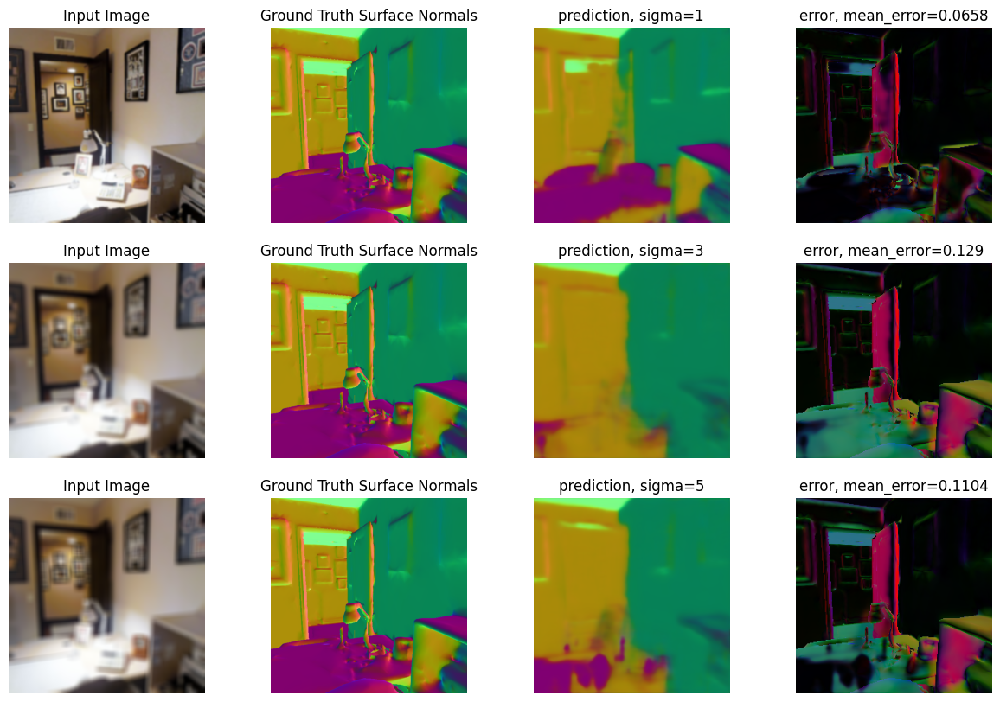

In [10]:
## Create Gaussian Blur
def gaussian_blur(x, sigma):
    GB_transform = transforms.GaussianBlur(kernel_size=9, sigma=sigma)
    return GB_transform(x)

## Apply the corruption at 3 different scale levels to create an increasing amount of distribution shift. Observe the errors

fig, axes = plt.subplots(3, 4, figsize=(15, 10))

for i, sigma in enumerate([1, 3, 5]):    
    x = gaussian_blur(img_tensor, sigma=sigma)
    ## Obtain the prediction for UNet model given the RGB image
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()
    ## Visualize the input image, ground truth, prediction, and error image

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title(f'prediction, sigma={sigma}')
    

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];


#### Corruption #3: Contrast (5 pts)

This time we will change the contrast of the image which can be considered as a digital corruption. For your convenience, we provide an implementation.

In the cell below, please do the followings:

2. Pass the image corrupted with contrast change to the model and get the prediction. Do this for three different scale values, for example 0.4, 0.2, 0.05.

3. For each scale level, obtain the above 1x4 visualizations we had before (Input image, GT, predictions, error image with mean l1 error in the title). So in total you should have a 3x4 plot. Please don't forget to put mean l1 errors in the title of the error image.

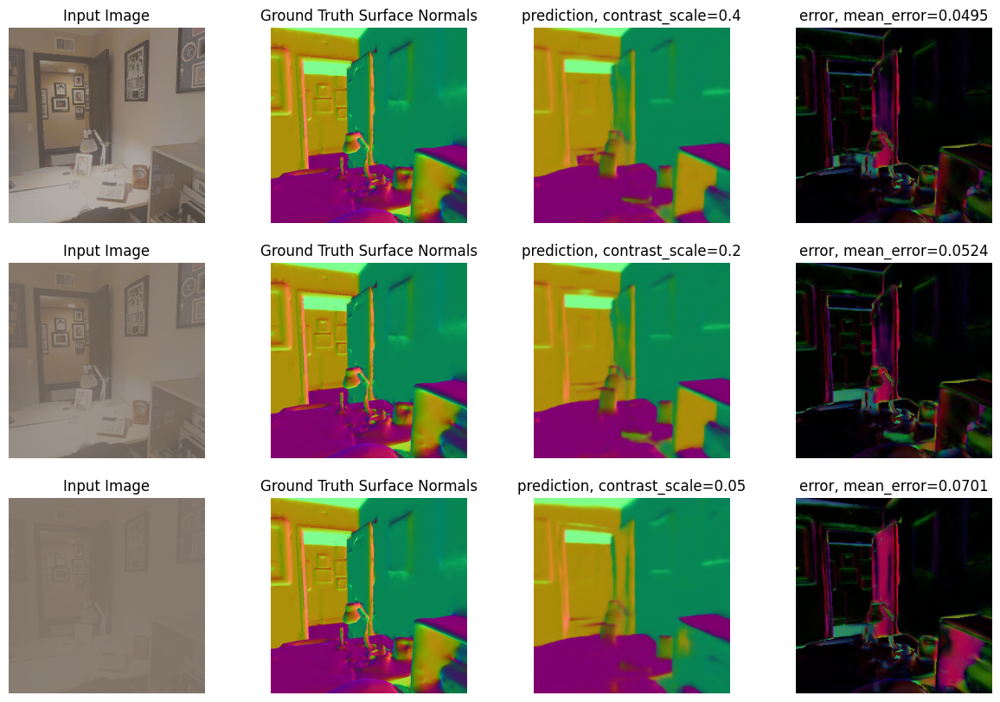

In [11]:
## Create Contrast Change
def contrast(x, contrast_scale=1):
    x = x.squeeze().permute(2,1,0).cpu().numpy()
    means = np.mean(x, axis=(0, 1), keepdims=True)
    x = np.clip((x - means) * contrast_scale + means, 0, 1) #* 255
    x = torch.from_numpy(x).float().permute(2,1,0).unsqueeze(0).to(device)
    return x

## Apply the corruption at 3 different scale levels to create an increasing amount of distribution shift. Observe the errors
fig, axes = plt.subplots(3, 4, figsize=(15, 10))

for i, contrast_scale in enumerate([0.4, 0.2, 0.05]):    
    x = contrast(img_tensor, contrast_scale=contrast_scale)
    ## Obtain the prediction for UNet model given the RGB image
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()
    ## Visualize the input image, ground truth, prediction, and error image

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title(f'prediction, contrast_scale={contrast_scale}')
    

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];


#### Open ended question on Gaussian blur and contrast corruptions (5 pts)

#### Question:

1. Comparing Gaussian blur and contrast, which one seems to be more problematic for the model?
2. What could be the reason(s) behind different corruptions affecting the model differently?

#### Answer:

1. Gaussian blur is more problematic as it leads to bigger loss and worse predictions.
2. Different corruptions affect the features of the image differently. It depends on how the model uses the features of the image to generate the predictions. Therefore, it is reasonable that different corruptions affect the model in different ways. For example, bluring to some extent conceals the edges which are useful for surface normal prediction. Therefore, as we saw, bluring worsens the model predictions more than contrast.  

### 2.2. 3D Image Corruptions

2D corruptions above we examined are useful but they do not take scene content into account (e.g. its geometry or semantics), thus they may be **less realistic**. 3D corruptions proposed in [Kar et al. (2022)](https://3dcommoncorruptions.epfl.ch/), on the other hand, aims to generate more realistic corruptions that reflect the real-world performance better.

To generate these corruptions, you need some sort of a 3D & semantic information. For easy experimentation, we'll consider only one corruption from this set.

![3D Common Corruptions](https://3dcommoncorruptions.epfl.ch/img_robust/overview.png)

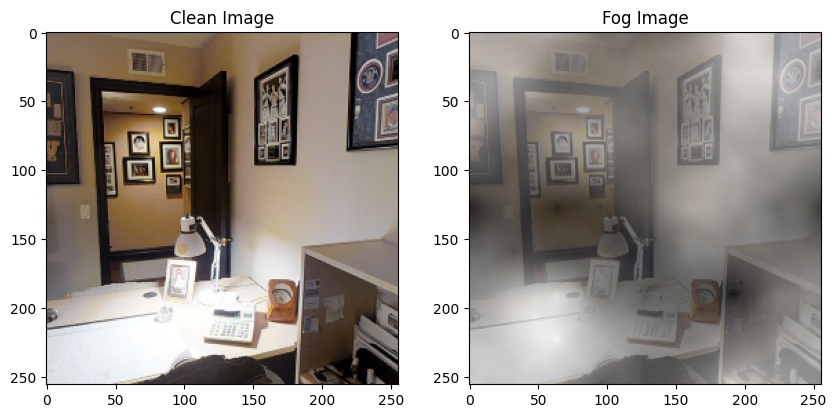

In [12]:
## First observe the Fog corruption from 2D Common Corruptions.

img_fog_path = './data/rgb/point_0_view_0_domain_fog.png'
img_fog = Image.open(img_fog_path)
img_fog_tensor = trans_totensor(img_fog)

## Visualize the clean and foggy images
plt.subplots(1,2, figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(img_tensor.squeeze().permute(1,2,0).detach().cpu().numpy())
plt.title('Clean Image')

plt.subplot(1,2,2)
plt.imshow(img_fog_tensor.squeeze().permute(1,2,0).detach().cpu().numpy())
plt.title('Fog Image')

plt.show()


As you could notice, the fog image on the right doesn't look like what a foggy image would look life in real world. Normally, we'd expect the fog to get thicker with more distance, i.e. it should be informed by 3D. Let's try to implement it. (Note that one can always claim having fog in an indoor scene doesn't make too much sense as well :), but we are resorting to it out of convenience as Taskonomy models are trained with indoor data.)

Below we are providing the scene depth for you that will be required to generate 3D fog effect.

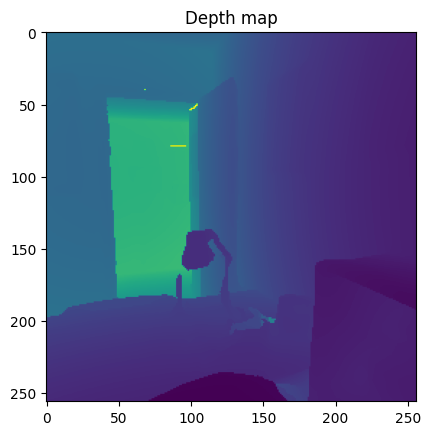

In [13]:
## Load the scene depth and preprocess
img_depth_path = './data/depth/point_0_view_0_domain_depth_euclidean.png'
img_depth = Image.open(img_depth_path)
img_depth_tensor = trans_totensor(img_depth)
# img_depth_tensor = transforms.ToTensor()(img_depth)
img_depth_tensor = img_depth_tensor.float() / 8000.
img_depth_tensor[img_depth_tensor >= 1.0] = img_depth_tensor[img_depth_tensor < 1.0].max()

## Visualize depth

plt.imshow(img_depth_tensor.squeeze())
plt.title('Depth map')
plt.show()


#### Creating 3D Corruption: 3D Fog (10 pts)

We will follow the standard fog model from [Sakaridis et al. (2018)](https://link.springer.com/article/10.1007/s11263-018-1072-8):

$$  I(x) = R(x)t(x) + A(1-t(x)) $$ 

where $I(x)$ is the foggy image at pixel $x$, $R(x)$ is the clean pixel, $A$ is atmospheric light (can be set to mean value of the image), and $t(x)$ is the transmission function describing the amount of light that reaches the camera:

$$  t(x) = \text{exp}(-\beta d(x)) $$

where $d(x)$ is the scene depth at pixel $x$ and $\beta$ is the attenuation coefficient that controls the fog thickness.

In the cell below, please do the followings:

1. Define a fog_3d function that takes an input image, scene depth and fog strength ($\beta$). It should return the image corrupted with the 3D fog. See the above indoor image with 3D Fog for an example.

2. Obtain the image with 3D fog at fog strength 20. Create a 1x3 plot to visualize clean, 2D fog and 3D fog versions of the input image.

3. Pass the image corrupted with 3D Fog to the model and get the prediction. Do this for three different fog strengths, for example 20, 30, 40.

4. For each std level, obtain the above 1x4 visualizations we had before (Input image, GT, predictions, error image with mean l1 error in the title). So in total you should have a 3x4 plot. Please don't forget to put mean l1 errors in the title of the error image.


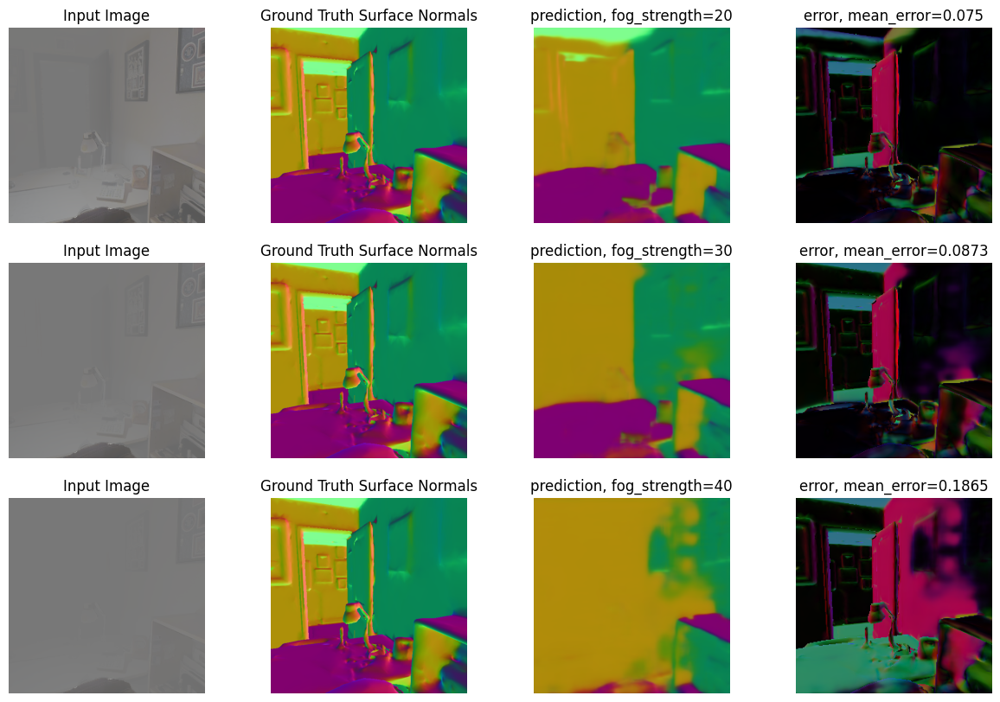

In [14]:
def fog_3d(rgb, depth, fog_strength=1):
    t_x = torch.exp(-fog_strength * depth)
    A = torch.mean(rgb)
    fuggy = rgb * t_x + A*(1 - t_x)
    return fuggy

## Now visualize clean, 2D and 3D fog versions next to each other

fig, axes = plt.subplots(3, 4, figsize=(15, 10))

for i, fog_strength in enumerate([20, 30, 40]):    
    x = fog_3d(img_tensor, img_depth_tensor.to(device), fog_strength=fog_strength)
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title(f'prediction, fog_strength={fog_strength}')

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];

#### Open ended question on 3D fog (5 pts)

#### Question:
1. What differences do you observe between the 2D and 3D fog images? 
2. Do the errors made against the 3D fog input exhibit some behaviour? 

#### Answer:

1. The 3d fog seems more natural as it takes the depth of the objects into account and the fogg is thicker in the deeper parts of the image.
2. Yes, the surface normals of the objects in the same neighboorhood are predicted similarly since the fogg has concealed the edges (boundaries between objects), therefore, we don't see the detailed normals, we only see the normals of the general neghbourhoods.

### 2.4. Adversarial Shifts

The previous shifts we examined were not targeting the model, i.e. they were attacks that are not specific to a particular model. We can also optimize for a distribution shift that results in worst-case performance given an attack budget $\epsilon$. This is called adversarial shift (or attack).

We will implement one of the most standard ones, called [Iterative-Fast Gradient Sign Method](https://arxiv.org/abs/1611.01236) (i-FGSM). It consists of the following steps:

$$ \text{Step 1:}~~ X_0 = X $$
$$ \text{Step 2 (Repeat as required):}~~ X_{n+1} = \text{Clip}_{X, \epsilon}(X_n + \alpha~\text{sign}(\nabla_{X} L(X_n,Y) )  $$

where 
- $X_0$ is the clean image (iteration 0)
- $X_n$ is the image after running the optimization for n iteration
- $L(X,Y)$ is the loss function used to train the model. It corresponds to the l1 norm between the ground truth $Y$ and model predictions $\hat{Y}$ given the input image $X$, i.e. $||Y-\hat{Y}||_1$
- $\alpha$ is the learning rate which we set to 1 for convenience.
- $\epsilon$ is the attack budget which corresponds to the maximum perturbation we can add to the image. 
- $\text{Clip}_{X, \epsilon}(A)$ denotes element-wise clipping of $A$ to the range $[X-\epsilon, X+\epsilon]$.
- $\text{sign}(A)$ is a function that returns the elementwise sign of entries of $A$.

As you would expect, we can create a training loop using the above two-step formulation, and run it for n steps for a given attack budget $\epsilon$. This will create an adversarially perturbed input image, which we can then feed to the model to observe how it performs.

#### Creating adversarial attack - part 1 (10 pts)


In the cell below, please do the followings:

1. Define a function named attack_ifgsm that takes as input the clean RGB image ($X_0$), ground truth ($Y$), attack budget ($\epsilon$), and number of iterations. It should run the above optimization for the given parameters using the UNet model and return the adversarially perturbed image.
2. Now let's first create attack for four different attack budgets (including no attack, i.e. $\epsilon=0$ and three non-zero attacks: $1./255, 16./255, 32./255$) for 1 iteration. This is just one-step FGSM attack which will be weaker than the multi-step attack. 
3. Similar to what we did before, plot the input image, ground truth, model predictions, and error image side-by-side in a 1x4 plot. Repeat this for all four attack budgets. At the end, you should have a 4x4 plot.

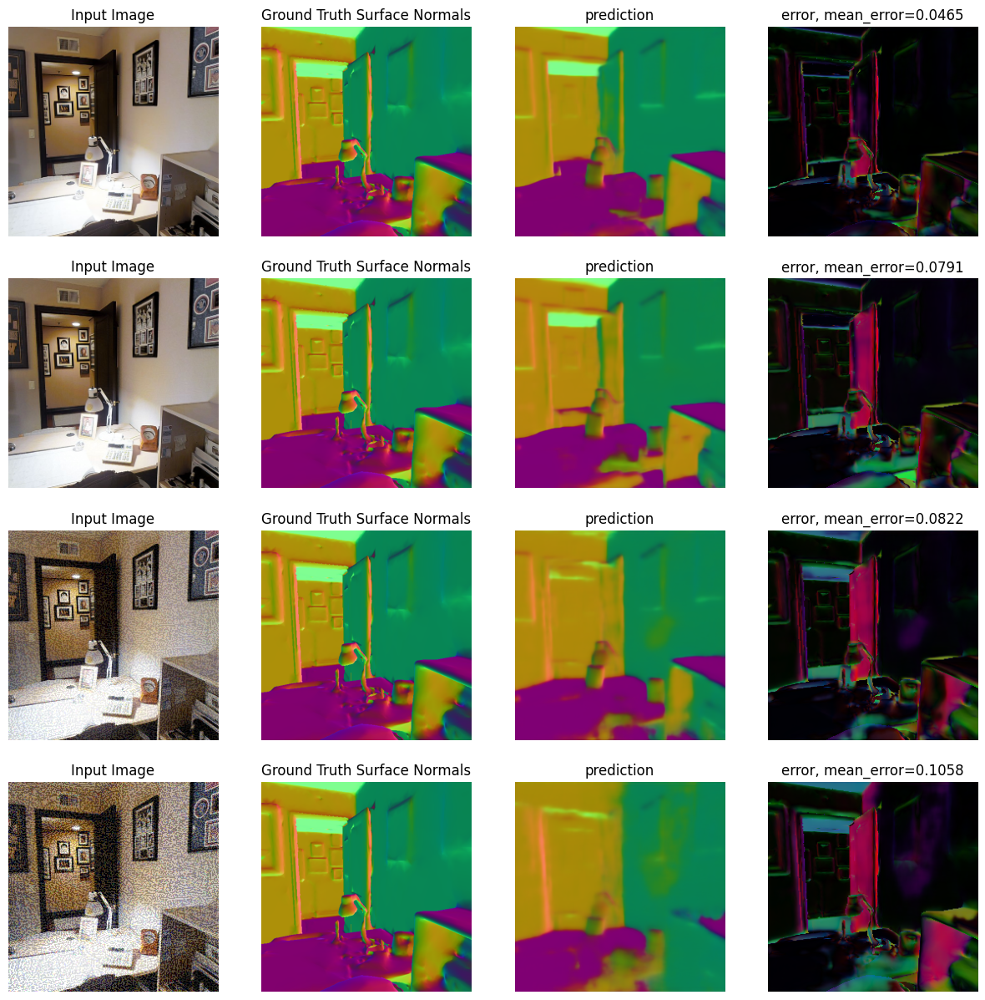

In [15]:
#Define a function named attack_ifgsm that takes as input the clean RGB image ($X_0$), ground truth ($Y$), attack budget ($\epsilon$), and number of iterations. It should run the above optimization for the given parameters using the UNet model and return the adversarially perturbed image.
criterion = nn.L1Loss()

# img_tensor_reshaped = img_tensor.squeeze().permute(1,2,0).detach().cpu()
gt_tensor_reshaped = gt_tensor.squeeze().permute(1,2,0).detach().cpu()

def attack_ifgsm(rgb, gt, epsilon=8./255, nb_iters=1):
    # YOUR CODE HERE
    x = rgb.clone().detach().requires_grad_(True)
    for i in range(nb_iters):
        prediction = model(x)
        loss = criterion(prediction, gt)
        loss.backward()
        x = x + epsilon * torch.sign(x.grad)
        x = torch.clamp(x, x-epsilon, x+epsilon)
        x = x.detach().requires_grad_(True)
    return x

## Create attack for different epsilons (including 0 epsilon, i.e. no attack), fixed nb_iters=1 (i.e no iteration, just one-step FGSM attack)

fig, axes = plt.subplots(4, 4, figsize=(15,15))
nb_iters = 1
for i, epsilon in enumerate([0./255, 1./255, 16./255, 32./255]):
    x = attack_ifgsm(img_tensor, gt_tensor.to(device), epsilon=epsilon, nb_iters=nb_iters)
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title('prediction')

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];

#### Creating adversarial attack - part 2 (5 pts)


If you implement this correctly, you should observe that as we increase $\epsilon$ we get stronger attacks but the perturbation gets also more visible. Still, even with very small $\epsilon$ we can get quite a bit of increase in the l1 error the model made.
Now, let's change this a bit. This time, fix the attack budget to be small, e.g. $\epsilon=1.0/255$ and increase number of iterations for a more powerful attack. Try running the optimization for 1, 5, and 10 iterations. Like you did above, plot the results. It should be a 3x4 plot.

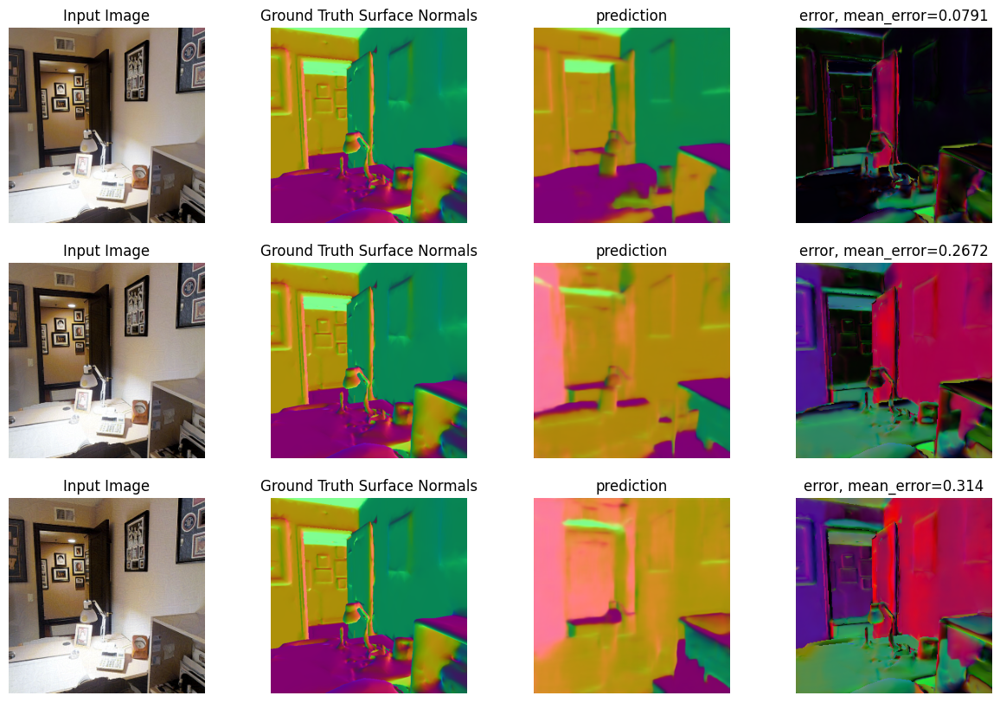

In [16]:
## This time, fixed the budget to be small, i.e. 1.0/255 and increase nb_iters for a more powerful attack

epsilon = 1./255
fig, axes = plt.subplots(3, 4, figsize=(15,10))

for i, nb_iters in enumerate([1, 5, 10]):
    x = attack_ifgsm(img_tensor, gt_tensor.to(device), epsilon=epsilon, nb_iters=nb_iters)
    prediction = model(x)
    prediction = prediction[0].permute(1, 2, 0).detach().cpu()

    axes[i][0].imshow(x.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('Input Image')

    axes[i][1].imshow(gt)
    axes[i][1].set_title('Ground Truth Surface Normals');

    axes[i][2].imshow(prediction)
    axes[i][2].set_title('prediction')

    error_img = abs(gt_tensor.squeeze().permute(1, 2, 0) - prediction)
    axes[i][3].imshow(error_img)
    mean_error = torch.mean(error_img)
    axes[i][3].set_title(f'error, mean_error={round(mean_error.item(), 4)}')

    [ax.set_axis_off() for ax in axes[i]];

#### Open ended question on adversarial attacks (5 pts)

#### Question:
1. Comparing the two settings we investigated (fixed number of iterations but changing attack budget vs changing number of iterations but fixed attack budget), what differences do you observe?
2. Comparing adversarial and non-adversarial shifts we experimented with, which ones do you think are more harmful in a practical scenario? Which one is more likely to occur? Explain why.

#### Answer:

1. Increasing the number of iterations is much more effective than increasing the budget since the error increases more rapidly, but the shift on the original image does not get more visible which is good.  
2. Non-adversarial shift is more harmful and more likely to occur since in a practical scenario, most of the times we don't have access to the weights or even the architecture of the model to optimize an Adversarial shift for it. In contrast, we can always apply Non-adversarial shifts to any image we want without any knowledge of the target model so it is more likely to occur. Moreover, if we can find a Non-adversarial shift that harms the results of a model, we can try the same shift with every other image and attack the model (or even other models!). Therefore, Non-adversarial shift is more harmful and more likely to occur.

### 3. Improving robustness 

So far we investigated the robustness issues due to adversarial and non-adversarial shifts. Now, let's switch gears and examine some methods used to improve model robustness.

We will compare two surface normal models. The first one is the UNet model trained on Taskonomy, which was the model we were using so far. Here we denote it as "baseline model". The second model, denoted as "robust model", has three differences than the baseline model:

1) It is trained on a larger base dataset, called [Omnidata](https://omnidata.vision/).
2) It is trained with 2D and 3D data augmentations.
3) It uses a transformer based architecture ([DPT](https://arxiv.org/abs/2103.13413)).
4) It is trained with consistency constraints.

You can see [this paper](https://arxiv.org/abs/2203.01441) for more details on it if you are interested.

Note that for a rigorous comparison between these two models, we should gradually change one component at a time while keeping the rest of the variables same. For example, we can compare two UNets trained without any augmentations on Taskonomy and Omnidata to see the impact of dataset first. Then we can add augmentations on that, then change the base architecture, and so on. Since this is a notebook with many components already, we will make it easier and just compare the two models at a high level.

In [17]:
# We have already loaded the UNet model. Let's also load the DPT model now.

model_arch_dpt = DPTRegressionModel(num_channels = 3, backbone = 'vitb_rn50_384', non_negative=False)
map_location = (lambda storage, loc: storage.cuda()) if torch.cuda.is_available() else torch.device('cpu')
model_robust = WrapperModel(DataParallelModel(model_arch_dpt.to(device)))
model_robust_state_dict = torch.load('./models/ckpts/robust_model.pth', map_location=map_location)
model_robust.load_state_dict(model_robust_state_dict["('rgb', '"+'normal'+"')"])

<All keys matched successfully>

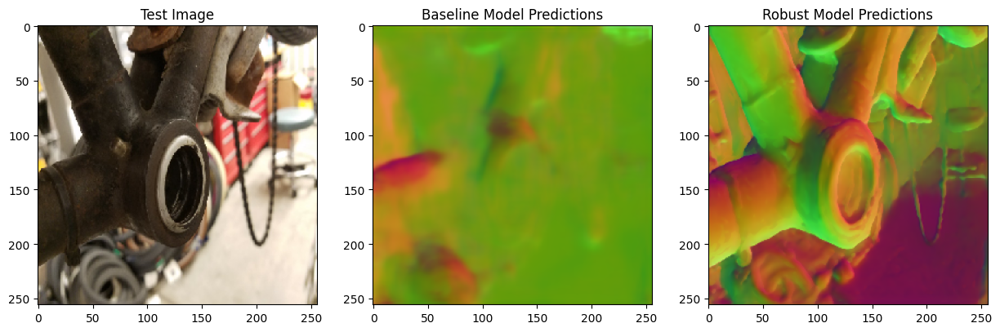

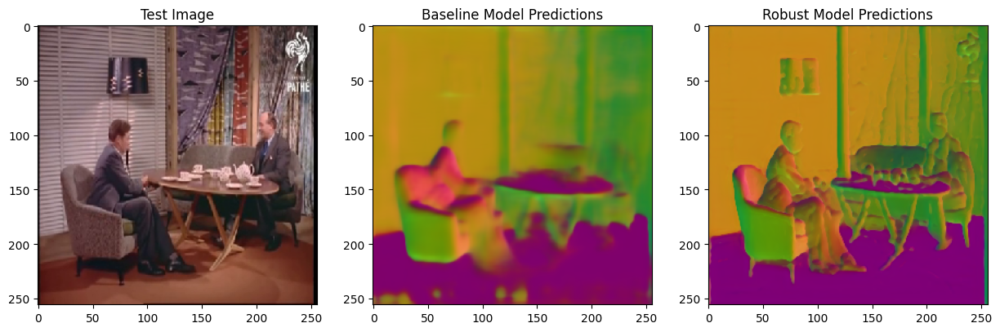

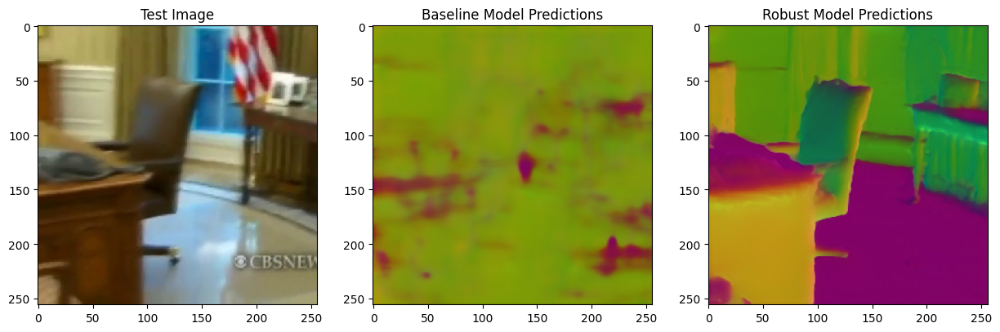

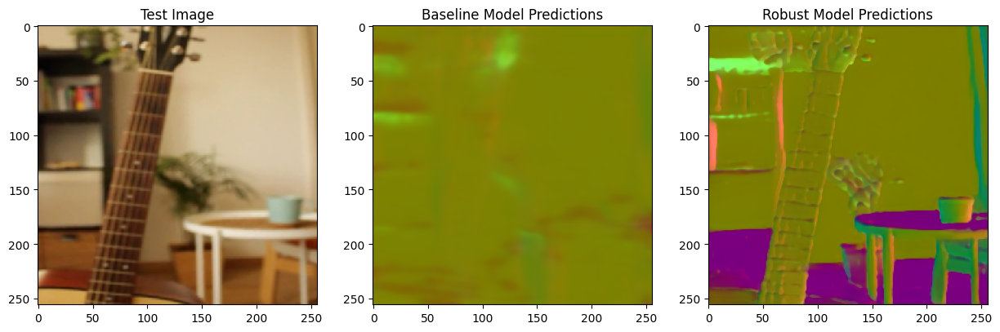

In [18]:
# Now let's compare the predictions of the baseline model and robust model on some in-the-wild queries from YouTube and manually collected data.

for test_img in ['demo_0.png','demo_1.png','demo_2.png','demo_3.png']:
    img_curr_test = Image.open(f'./data/rgb_test/{test_img}')
    img_curr_test = trans_totensor(img_curr_test).unsqueeze(0)[:,:3].to(device)
    baseline_pred = model(img_curr_test)
    robust_pred = model_robust(img_curr_test)

    plt.subplots(1,3, figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img_curr_test.cpu().squeeze().permute(1,2,0).detach().numpy())
    plt.title(f'Test Image')

    plt.subplot(1,3,2)
    plt.imshow(baseline_pred.cpu().squeeze().permute(1,2,0).detach().numpy())
    plt.title('Baseline Model Predictions')

    plt.subplot(1,3,3)
    plt.imshow(robust_pred.cpu().squeeze().permute(1,2,0).detach().numpy())
    plt.title('Robust Model Predictions')

#### Open ended question on improving robustness (5 pts)

#### Question:
1. What changes did you observe between the predictions of baseline model and robust model? 
2. What could be the most impactful factors behind those changes?

#### Answer:

1. The predictions of the non-robust model are mostly non-informative and useless (except for the second image) as the surface normals are not visible at all. On the contrary, the surface normals predicted by the robust model are totally clear.
2. 
  - One reason is that in the training time, the robust model has been trained on a larger dataset including a diverse set of shifted and augmented images which have made the model more robust and generalized for the test time.
  - The robust model uses transformer-based architecture. The attention mechanism of the transformer-based architecture might help in learning more robust features.

#### Making the robust model fail (Bonus 10 pts)

Now this time, introduce a distribution shift that also degrades the performance of robust model. This can be any of the previous shifts we have seen or something new. Plot the resulting visuals for the baseline model and robust model.

Some rules:
1. You will get full point if you find an example where model predictions completely fail (e.g. predicting constant values everywhere or geometrically meaningless normals like the baseline model predictions above) while the surface normals are still pretty clear for a human observer.
2. You can also attack the model adversarially, but it is almost always possible to find examples when you optimize for it. Hence, you will lose some points.


Text(0.5, 1.0, 'prediction')

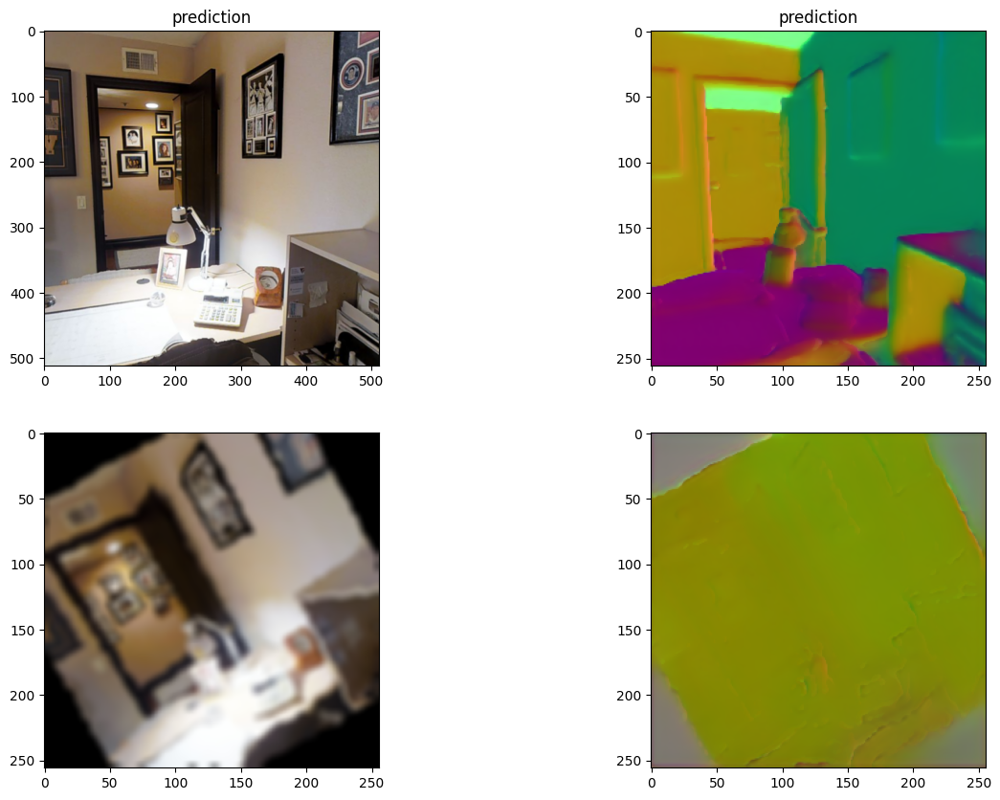

In [27]:
## Make the robust model fail

shifted_img = transforms.functional.rotate(img, angle=29.0)
shifted_img = transforms.ElasticTransform(alpha=100.0)(shifted_img)
shifted_img = transforms.RandomPosterize(bits=2)(shifted_img)
shifted_img = trans_totensor(shifted_img).unsqueeze(0).to(device)
shifted_img = gaussian_blur(shifted_img, sigma=3)


orig_prediction = model_robust(img_tensor)
noisy_prediction = model_robust(shifted_img)

fig, axes = plt.subplots(2, 2, figsize=(15,10))

axes[0][0].imshow(img)
axes[0][1].imshow(orig_prediction.cpu().squeeze().permute(1,2,0).detach().numpy())
axes[0][0].set_title(f'original image')
axes[0][1].set_title(f'shifted image')

axes[1][0].imshow(shifted_img.cpu().squeeze().permute(1,2,0).detach().numpy())
axes[1][1].imshow(noisy_prediction.cpu().squeeze().permute(1,2,0).detach().numpy())
axes[0][0].set_title(f'prediction')
axes[0][1].set_title(f'prediction')

### 4. Test-time adaptation

Finally we will consider a toy setup for test-time adaptation. Remember the dichotomy between training-time and test-time robustness mechanisms. Most methods aiming to improve model robustness focus on training-time mechanisms, e.g. data augmentation. However, we can also imagine finding ways to improve model at test-time by **adapting** it to the distribution shift. 

In test-time adaptation, we assume access to an adaptation signal that is useful for the original task we care about. For example, if we want to predict depth using a neural network, having access to a depth sensor (e.g. Lidar) could be helpful because we can use the measurements from that sensor to correct our neural network predictions. Alternatively, one can try finding self-supervised tasks that won't require any label, hence can be optimized at test-time. Then the challenge is to find those tasks such that they will result in an improvement for the original task we care about (e.g. depth prediction, image classification, etc.). Please see the lecture notes for some examples.

For simplicity with experimentation, here we assume we have access to a "sparse ground truth" as test-time adaptation signal. In other words, we will mask the ground truth and only use few pixels from it to train the baseline model on the test image.

There are only 997 pixels with annotation in the adaptation signal. The sparsity ratio is 0.005071004231770833


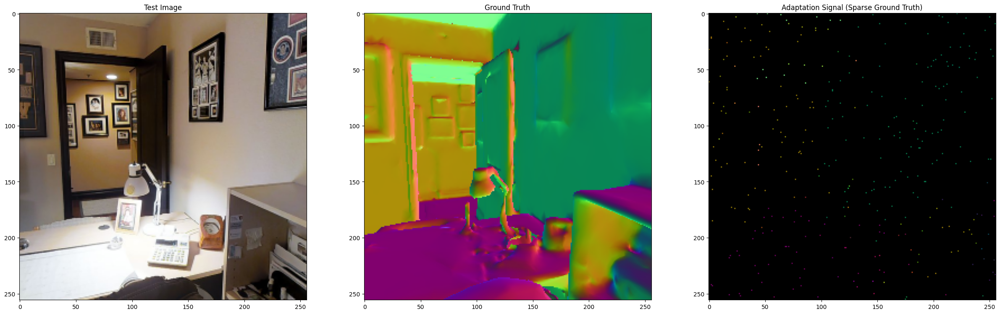

In [20]:
## Create adaptation signal, i.e. sparse ground truth

mask = (torch.rand(256,256) < 0.005).float()
mask = mask.repeat(1,3,1,1).to(device)
adaptation_signal = (gt_tensor.to(device) * mask).to(device)

plt.subplots(1,3, figsize=(30,10))

plt.subplot(1,3,1)

plt.imshow(img_tensor.cpu().squeeze().permute(1,2,0).detach().numpy())
plt.title(f'Test Image')

plt.subplot(1,3,2)
plt.imshow(gt_tensor.cpu().squeeze().permute(1,2,0).detach().numpy())
plt.title('Ground Truth')

plt.subplot(1,3,3)
plt.imshow(adaptation_signal.cpu().squeeze().permute(1,2,0).detach().numpy())
plt.title('Adaptation Signal (Sparse Ground Truth)')

print(f"There are only {len(adaptation_signal[adaptation_signal>0])} pixels with annotation in the adaptation signal. The sparsity ratio is {len(adaptation_signal[adaptation_signal>0])/len(adaptation_signal.flatten())}" )


#### Performing test-time adaptation (10 pts)


As you see, we have access to ground truth for only around 0.5% of the entire image! Would this be helpful to improve model predictions?

In the cell below, please do the followings:
1. Pick any of the distribution shifts you created above which results in at least 0.10 l1 error on the baseline model, for example Gaussian blur with std=2. Apply that to the input image.
2. Run a training loop on this example using the baseline model. Use the following hyperparameters:
- Optimizer: Adam with learning rate 3e-5
- Loss: l1_norm between the predicted surface normals and adaptation signal we generated above. Important: Compute this loss only on the pixels where the adaptation signal is nonzero.
- Number of iterations: Try for 10, 50, 100 iterations. Print the loss after each iteration and make sure that it is decreasing. 
3. Visualize input image and the predictions of the model before and after the optimization. Put the mean l1 errors on the titles of the subplots. You should have a 3x3 plot.

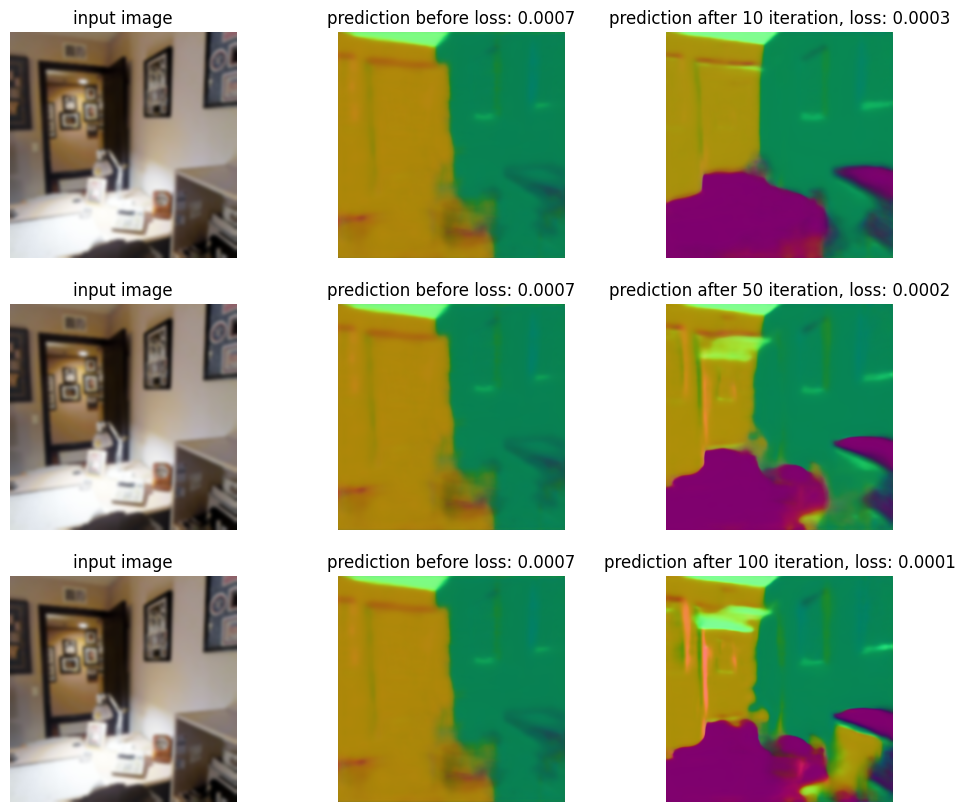

In [21]:
## Run test-time training, plot the results
model.load_state_dict(model_state_dict["('rgb', '"+'normal'+"')"])

optimizer = torch.optim.Adam(model.parameters(), lr=3e-5)
criterion = torch.nn.L1Loss()
num_iters = [10, 50, 100]

shifted_img = gaussian_blur(img_tensor, sigma=2)
prediction_before = model(shifted_img)
prediction_before_ = prediction_before.clone()
prediction_before_[adaptation_signal == 0] = 0
loss_before = criterion(prediction_before_, adaptation_signal.to(device))

fig, axes = plt.subplots(3, 3, figsize=(12,10))

for i, num_iter in enumerate(num_iters):
    model.load_state_dict(model_state_dict["('rgb', '"+'normal'+"')"])
    for iter in range(num_iter):
        optimizer.zero_grad()
        prediction = model(shifted_img)
        prediction_ = prediction.clone()
        prediction_[adaptation_signal == 0] = 0
        loss = criterion(prediction_, adaptation_signal.to(device))
        loss.backward()
        optimizer.step()
    prediction_after = prediction

    axes[i][0].imshow(shifted_img.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][0].set_title('input image')
    axes[i][1].imshow(prediction_before.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][1].set_title(f'prediction before loss: {round(loss_before.item(), 4)}')
    axes[i][2].imshow(prediction_after.squeeze().permute(1, 2, 0).detach().cpu())
    axes[i][2].set_title(f'prediction after {num_iter} iteration, loss: {round(loss.item(), 4)}')
    [ax.set_axis_off() for ax in axes[i]]

#### Open ended question on test-time adaptation (5 pts)

#### Question:
1. Do you observe a noticeable improvement in the model predictions after adaptation?
2. What happens when you increase the number of iterations?
3. As we mentioned, this adaptation signal may not be too realistic as it assumes access to ground truth (even if it is sparse). What could be a more practical adaptation signal to use here?

#### Answer:

1. Yes, the improvement is significant and clearly visible. The new surface normal predictions are much better.
2. As the number of iterations increase, the errors get smaller and the quality of the surface normal predictions improves.
3. One possible adaption signal is outputs of a edge-detection or a segmentation model which can give some cues for the model to generate better results as segmentation and edge-detection are related to the surface-normal prediction task.

##### Acknowledgement

Thanks Teresa Yeo and Roman Bachmann for their help with preparing this notebook.